In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure


 #Configuration of plots
    
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)


#Getting the data

df= pd.read_csv(r'C:\Users\HP\Downloads\movies.csv')


In [2]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [3]:
print(df.shape)

df.describe()

(7668, 15)


,year,score,votes,budget,gross,runtime
count,7668.000000,7665.000000,7.665000e+03,5.497000e+03,7.479000e+03,7664.000000
mean,2000.405451,6.390411,8.810850e+04,3.558988e+07,7.850054e+07,107.261613
std,11.153508,0.968842,1.633238e+05,4.145730e+07,1.657251e+08,18.581247
min,1980.000000,1.900000,7.000000e+00,3.000000e+03,3.090000e+02,55.000000
25%,1991.000000,5.800000,9.100000e+03,1.000000e+07,4.532056e+06,95.000000
50%,2000.000000,6.500000,3.300000e+04,2.050000e+07,2.020576e+07,104.000000
75%,2010.000000,7.100000,9.300000e+04,4.500000e+07,7.601669e+07,116.000000
max,2020.000000,9.300000,2.400000e+06,3.560000e+08,2.847246e+09,366.000000


In [4]:
#DATA CLEANING
# MISSING DATA

# Percent missing data in each column
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))
    
#Count of missing data in each column
df.isnull().sum()

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [5]:
#MANAGING MISING DATA IN EACH COLUMN

#drop the rows with all NaN values
df.dropna(how = 'all')

#filling budget and gross missing data using interpolate
df.budget= df.budget.interpolate(method ='linear', limit_direction ='forward')
df.gross=df.gross.interpolate(method='linear', limit_direction='forward')

#filling rating missing value with previous ones 
df.rating= df.rating.fillna(method ='pad')


df.isnull().sum()

name         0
rating       0
genre        0
year         0
released     2
score        3
votes        3
director     0
writer       3
star         1
country      3
budget       0
gross        0
company     17
runtime      4
dtype: int64

In [6]:
#droping all the missing value
df=df.dropna()

df.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [7]:
#Data Types

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [8]:
#Changing Data type

df['budget']=df['budget'].astype('int64')

df['gross']=df['gross'].astype('int64')

df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7658,Black Wall Street Burning,R,Drama,2020,"February 7, 2020 (United States)",6.6,35.0,Marcus Brown,Dekoven Riggins,Dan Belcher,United States,5000,12916074,Notis Studio,78.0
7659,I Am Fear,Not Rated,Horror,2020,"March 3, 2020 (United States)",3.4,447.0,Kevin Shulman,Kevin Shulman,Kristina Klebe,United States,336666,13266,Roxwell Films,87.0
7660,Aloha Surf Hotel,Not Rated,Comedy,2020,"November 5, 2020 (United States)",7.1,14.0,Stefan C. Schaefer,Stefan C. Schaefer,Augie Tulba,United States,668333,13266,Abominable Pictures,90.0
7664,Dream Round,R,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,32875,13266,Cactus Blue Entertainment,90.0


In [9]:
pd.set_option('display.max_rows',None)

#arranging based on gross revenue 
df=df.sort_values(by=['gross'],inplace = False, ascending=False)
df


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0


In [10]:
#Dropping the duplicates

df.drop_duplicates()
df.shape

(7643, 15)

In [11]:
#CORRELATION OF DATA WITH GROSS REVENUE


In [12]:
#pearson, kendall, spearman
#best suited = pearson

df.corr(method= 'pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.098278,0.223353,0.353662,0.259917,0.119789
score,0.098278,1.000000,0.409432,0.081512,0.185653,0.399965
votes,0.223353,0.409432,1.000000,0.448559,0.631208,0.308907
budget,0.353662,0.081512,0.448559,1.000000,0.705328,0.271086
gross,0.259917,0.185653,0.631208,0.705328,1.000000,0.243406
runtime,0.119789,0.399965,0.308907,0.271086,0.243406,1.000000


In [ ]:
#High correlation of between gross and budget

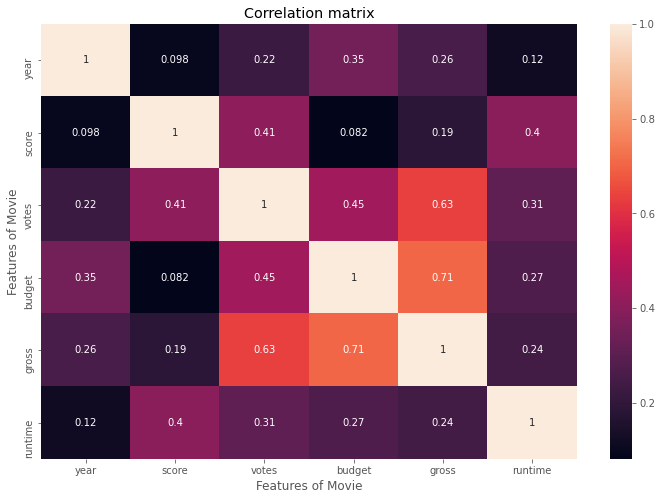

In [13]:
#Visualization of correlation 

correlation_matrix = df.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation matrix')
plt.xlabel('Features of Movie')
plt.ylabel('Features of Movie')
plt.show()

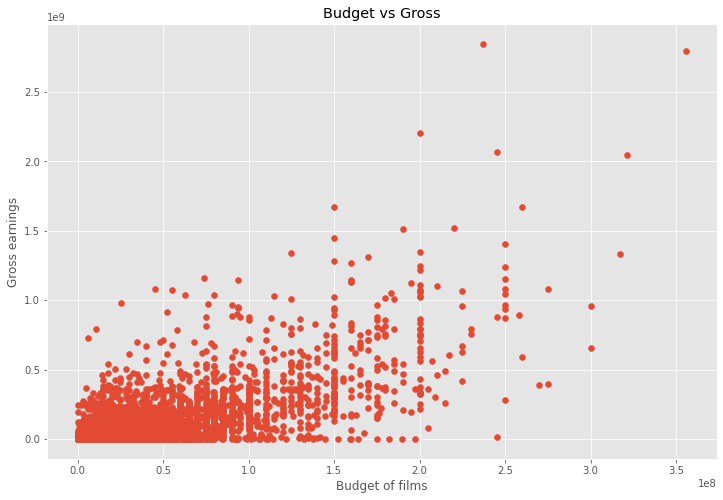

In [14]:
#Sactter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross')
plt.xlabel('Budget of films')
plt.ylabel('Gross earnings')
plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

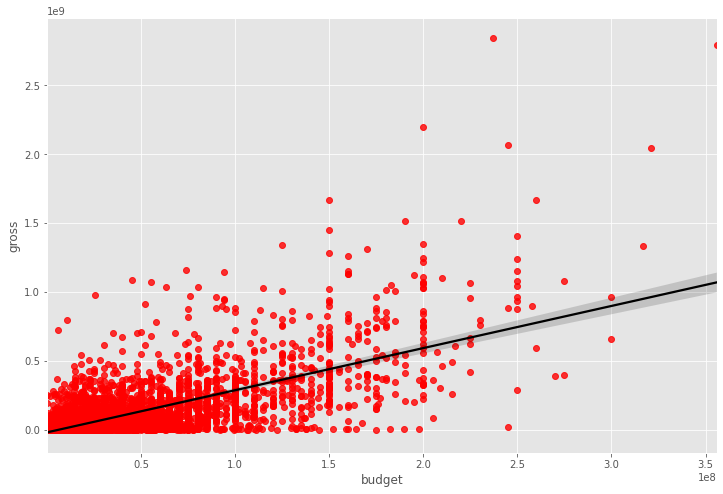

In [15]:
#Ploting budget vs gross using sns

sns.regplot(x='budget',y='gross', data=df, scatter_kws={"color":"red"}, line_kws={"color":"black"})

In [16]:
#CHECKING CORRELATION WITH ALL THE FEATURES


In [17]:
#Numerizing data types

df_numerized=df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype=='object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name]= df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,532,5,0,2009,693,7.8,1100000.0,1153,1774,2324,55,237000000,2847246203,2246,162.0
7445,534,5,0,2019,181,8.4,903000.0,162,739,2231,55,356000000,2797501328,1599,181.0
3045,6873,5,6,1997,701,7.8,1100000.0,1153,1774,1587,55,200000000,2201647264,2246,194.0
6663,5128,5,0,2015,695,7.8,876000.0,1123,2541,520,55,245000000,2069521700,1533,138.0
7244,535,5,0,2018,190,8.4,897000.0,162,739,2231,55,321000000,2048359754,1599,149.0
7480,6174,4,2,2019,1484,6.9,222000.0,1451,1914,671,55,260000000,1670727580,2309,118.0
6653,2964,5,0,2015,1700,7.0,593000.0,517,3554,435,55,150000000,1670516444,2274,124.0
6043,5484,5,0,2012,2467,8.0,1300000.0,1512,2306,2231,55,220000000,1518815515,1599,143.0
6646,2142,5,0,2015,218,7.1,370000.0,1186,702,2710,55,190000000,1515341399,2274,137.0
7494,2128,4,2,2019,2670,6.8,148000.0,432,1945,1519,55,150000000,1450026933,2308,103.0


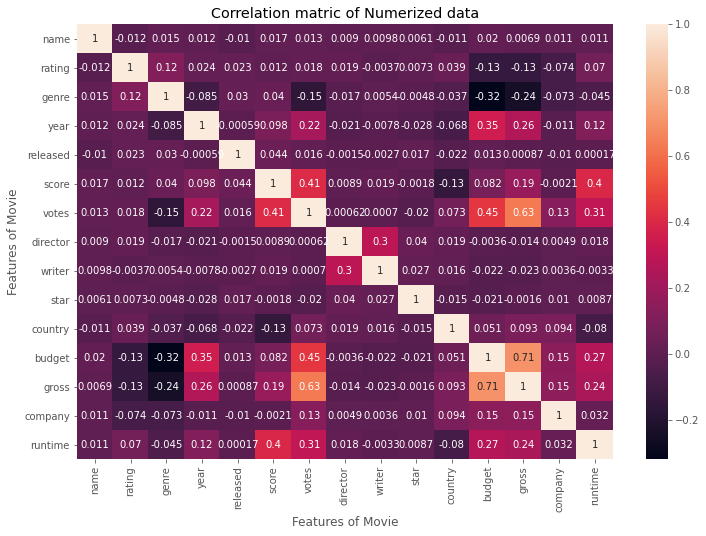

In [20]:
#Correlation matric of Numerized data

correlation_matrix = df_numerized.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation matric of Numerized data')
plt.xlabel('Features of Movie')
plt.ylabel('Features of Movie')
plt.show()

In [21]:
#CHECKING CORRELATION WITH ALL THE MOVIE FEATURES AFTER NUMERIZING THEM

df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.012005,0.015231,0.011931,-0.010470,0.016603,0.013239,0.008970,0.009833,0.006140,-0.011042,0.019702,0.006925,0.010557,0.010673
rating,-0.012005,1.000000,0.115180,0.023688,0.023403,0.011795,0.017768,0.019394,-0.003656,0.007271,0.038835,-0.130111,-0.128478,-0.074299,0.069541
genre,0.015231,0.115180,1.000000,-0.084693,0.030113,0.039793,-0.150201,-0.016630,0.005389,-0.004816,-0.036919,-0.317309,-0.238428,-0.072765,-0.045087
year,0.011931,0.023688,-0.084693,1.000000,-0.000594,0.098278,0.223353,-0.021358,-0.007794,-0.028390,-0.068436,0.353662,0.259917,-0.010606,0.119789
released,-0.010470,0.023403,0.030113,-0.000594,1.000000,0.043729,0.016338,-0.001545,-0.002700,0.016660,-0.022147,0.012704,0.000868,-0.009979,0.000171
score,0.016603,0.011795,0.039793,0.098278,0.043729,1.000000,0.409432,0.008872,0.019022,-0.001797,-0.133115,0.081512,0.185653,-0.002070,0.399965
votes,0.013239,0.017768,-0.150201,0.223353,0.016338,0.409432,1.000000,0.000622,0.000700,-0.019819,0.073448,0.448559,0.631208,0.131659,0.308907
director,0.008970,0.019394,-0.016630,-0.021358,-0.001545,0.008872,0.000622,1.000000,0.299397,0.039811,0.019410,-0.003632,-0.014476,0.004879,0.017980
writer,0.009833,-0.003656,0.005389,-0.007794,-0.002700,0.019022,0.000700,0.299397,1.000000,0.027071,0.015722,-0.022088,-0.023306,0.003574,-0.003251
star,0.006140,0.007271,-0.004816,-0.028390,0.016660,-0.001797,-0.019819,0.039811,0.027071,1.000000,-0.014582,-0.020910,-0.001613,0.010235,0.008732


In [22]:
#CREATING PAIRS FOR BETTER OBSERVATION

correlation_mat=df_numerized.corr()
corr_pairs=correlation_mat.unstack()
corr_pairs

name      name        1.000000
          rating     -0.012005
          genre       0.015231
          year        0.011931
          released   -0.010470
          score       0.016603
          votes       0.013239
          director    0.008970
          writer      0.009833
          star        0.006140
          country    -0.011042
          budget      0.019702
          gross       0.006925
          company     0.010557
          runtime     0.010673
rating    name       -0.012005
          rating      1.000000
          genre       0.115180
          year        0.023688
          released    0.023403
          score       0.011795
          votes       0.017768
          director    0.019394
          writer     -0.003656
          star        0.007271
          country     0.038835
          budget     -0.130111
          gross      -0.128478
          company    -0.074299
          runtime     0.069541
genre     name        0.015231
          rating      0.115180
        

In [23]:
#SORTING THE PAIRS

sorted_pairs=corr_pairs.sort_values()

sorted_pairs

genre     budget     -0.317309
budget    genre      -0.317309
gross     genre      -0.238428
genre     gross      -0.238428
          votes      -0.150201
votes     genre      -0.150201
country   score      -0.133115
score     country    -0.133115
rating    budget     -0.130111
budget    rating     -0.130111
gross     rating     -0.128478
rating    gross      -0.128478
year      genre      -0.084693
genre     year       -0.084693
country   runtime    -0.080025
runtime   country    -0.080025
company   rating     -0.074299
rating    company    -0.074299
genre     company    -0.072765
company   genre      -0.072765
year      country    -0.068436
country   year       -0.068436
runtime   genre      -0.045087
genre     runtime    -0.045087
country   genre      -0.036919
genre     country    -0.036919
star      year       -0.028390
year      star       -0.028390
writer    gross      -0.023306
gross     writer     -0.023306
released  country    -0.022147
country   released   -0.022147
budget  

In [25]:
#OBSERVING THE HIGHEST CORRELATION

high_corr=sorted_pairs[(sorted_pairs)>0.5]
high_corr

gross     votes       0.631208
votes     gross       0.631208
gross     budget      0.705328
budget    gross       0.705328
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [ ]:
#CONCLUSION
#HIGHEST CORRELATION WITH GROSS : VOTES AND BUDGET